<a href="https://colab.research.google.com/github/AndreiBaias/PAS/blob/main/cGAN/cGAN_first_try.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
root_path = 'gdrive/MyDrive/Colab Notebooks/maps-generator'

In [ ]:
root_path = '/tmp/final_images'

In [ ]:
from torch.utils.data import Dataset, DataLoader
import cv2 as cv
import glob
import matplotlib.pyplot as plt

import argparse
import os
import numpy as np
import math

import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch
from sklearn.model_selection import train_test_split

from PIL import Image

In [ ]:
data = []
for i in glob.glob(root_path+"/*"):
  #print(i)
  img = Image.open(i)
  img = img.convert('L')
  img = img.resize((128,128))
  img = np.asarray(img)/255
  data.append(img)

In [ ]:
# !unrar x "/content/final_images.rar" "/tmp"
!unrar x "/content/gdrive/MyDrive/final_images.rar" "/tmp"

Streaming output truncated to the last 5000 lines.
Extracting  /tmp/final_images/-08Ovw7BkaoMXl6GskivYQ.png                   0%  OK 
Extracting  /tmp/final_images/-0e55pjsngvKLMtDWp8QCQ.png                   0%  OK 
Extracting  /tmp/final_images/-1hgV6PQoey6salOD59Qjw.png                   0%  OK 
Extracting  /tmp/final_images/-21yJOKbwF4WAvAMdM5fjw.png                   0%  OK 
Extracting  /tmp/final_images/-2NTfhk2KSS7uJNWcWqm6Q.png                   0%  OK 
Extracting  /tmp/final_images/-2T-rQ5JHTKy0tOfxzy02w.png                   0%  OK 
Extracting  /tmp/final_images/-2xzORZC7dka4lsSh37M6g.png                   0%  OK 
Extracting  /tmp/final_images/-3p_SZ_pvtH4f7PVEBFHfg.png                   0%  OK 
Extracting  /tmp/final_images/-4GI37130L_afiDhXjRbdw.png                   0%  OK 
Extracting  /tmp/final_images/-4RRInkYtEjbxO6xm5UzIQ.png                   0%  OK 
Extracting  /tmp/final_images

In [ ]:
data = np.expand_dims(data, axis=3)
print(data[0].shape)


(128, 128, 1)


In [ ]:
from numpy import asarray
from numpy import savez_compressed
 
# save to npy file
savez_compressed('maps.npz', data)

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
def plot_images(imgs, grid_size = 5):
    """
    imgs: vector containing all the numpy images
    grid_size: 2x2 or 5x5 grid containing images
    """
     
    fig = plt.figure(figsize = (8, 8))
    columns = rows = grid_size
    plt.title("Training Images")
 
    for i in range(1, columns*rows +1):
        plt.axis("off")
        fig.add_subplot(rows, columns, i)
        plt.imshow(imgs[i],cmap='gray')
    plt.show()

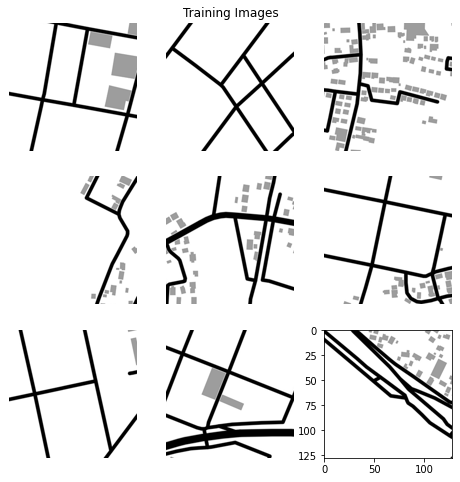

In [ ]:
# load the numpy vector containing image representations
imgs = np.load('maps.npz')
 
# pls ignore the poor quality of the images as we are working with 32x32 sized images.
plot_images(imgs['arr_0'][:,:,:,0], 3)

In [ ]:
class MapDataset(Dataset):
  def __init__(self, map_data, transform=None):
    self.data = map_data

  def __getitem__(self, idx):
    if torch.is_tensor(idx):
      idx = idx.tolist()

    map_data = self.data[idx]
    return map_data

  def __len__(self):
    return len(self.data)

In [ ]:
transpose_imgs = np.transpose( # imp step to convert image size from (7312, 32,32,3) to (7312, 3,32,32)
    np.float32(imgs['arr_0']), # imp step to convert double -&gt; float (by default numpy input uses double as data type)
    (0, 3,1,2) # tuple to describe how to rearrange the dimensions
    ) 
 
print(transpose_imgs.shape)
dset = MapDataset(transpose_imgs) # passing the npz variable to the constructor class
batch_size = 128
shuffle = True
 
dataloader = DataLoader(dataset = dset, batch_size = batch_size, shuffle = shuffle, num_workers=2)

for x in dataloader:
  print(x.shape)

(5000, 1, 128, 128)
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1, 128, 128])
torch.Size([128, 1,

In [ ]:
# class Opt:
#   def __init__(self):
#     self.n_epochs = 25
#     self.batch_size = 64
#     self.lr = 0.0002
#     self.b1 = 0.5
#     self.b2 = 0.999
#     self.n_cpu = 8
#     self.latent_dim = 100
#     self.n_classes = 10
#     self.img_size = 64
#     self.channels = 1
#     self.sample_interval = 400

# opt = Opt()

In [ ]:
image_shape = (1, 128, 128)
import matplotlib.pyplot as plt
import numpy as np
import torch
 
import torch.nn as nn
 
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torch.nn import Module, Sequential, Conv2d, ConvTranspose2d, LeakyReLU, BatchNorm2d, ReLU, Tanh, Sigmoid, BCELoss 
 

class Generator(Module):
    def __init__(self,img_size):
 
        # calling constructor of parent class
        super().__init__()
 
        self.gen = Sequential(
          ConvTranspose2d(in_channels = 100, out_channels = 16*img_size , kernel_size = 2, stride=2, output_padding =0, bias = True),
          # the output from the above will be b_size ,512, 4,4
          BatchNorm2d(num_features = 16*img_size), # From an input of size (b_size, C, H, W), pick num_features = C
          ReLU(inplace = True),
 
          ConvTranspose2d(in_channels = 16*img_size, out_channels = 8*img_size , kernel_size = 2, stride=2, output_padding =0, bias = True),
          # the output from the above will be b_size ,256, 8,8
          BatchNorm2d(num_features = 8*img_size),
          ReLU(inplace = True),
 
          ConvTranspose2d(in_channels = 8*img_size, out_channels = 4*img_size , kernel_size = 2, stride=2, output_padding = 0, bias = True),
          # the output from the above will be b_size ,128, 16,16
          BatchNorm2d(num_features = 4*img_size),
          ReLU(inplace = True),
 
          ConvTranspose2d(in_channels = 4*img_size, out_channels = 2*img_size , kernel_size = 2,stride=2, output_padding = 0, bias = True),
          BatchNorm2d(num_features = 2*img_size),
          ReLU(inplace = True),

          ConvTranspose2d(in_channels = 2*img_size, out_channels = img_size , kernel_size = 2,stride=2, output_padding = 0, bias = True),
          BatchNorm2d(num_features = img_size),
          ReLU(inplace = True),

          # the output from the above will be b_size ,3, 32,32
          ConvTranspose2d(in_channels = img_size, out_channels = 1 , kernel_size = 2,stride=3, output_padding = 1, bias = True),
          Tanh()
         
        )
 
    def forward(self, input):
        return self.gen(input)

In [ ]:
# Discriminator Model Definition


class Discriminator(Module):
    def __init__(self,img_size):
 
        super().__init__()
        self.dis = Sequential(
 
            # input is (3, 32, 32)
            Conv2d(in_channels = 1, out_channels = img_size, kernel_size = 3, stride = 2, padding = 1, bias=True),
            # ouput from above layer is b_size, 32, 16, 16
            LeakyReLU(0.2, inplace=True),
 
            Conv2d(in_channels = img_size, out_channels = img_size*2, kernel_size = 3, stride = 2, padding = 1, bias=True),
            # ouput from above layer is b_size, 32*2, 8, 8
            BatchNorm2d(img_size * 2),
            LeakyReLU(0.2, inplace=True),
 
            Conv2d(in_channels = img_size*2, out_channels = img_size*4, kernel_size = 3, stride = 2, padding = 1, bias=True),
            # ouput from above layer is b_size, 32*4, 4, 4
            BatchNorm2d(img_size * 4),
            LeakyReLU(0.2, inplace=True),
 
            Conv2d(in_channels = img_size*4, out_channels = img_size*8, kernel_size = 3, stride = 2, padding = 0, bias=True),
            # ouput from above layer is b_size, 256, 2, 2
            # NOTE: spatial size of this layer is 2x2, hence in the final layer, the kernel size must be 2 instead (or smaller than) 4
            BatchNorm2d(img_size * 8),
            LeakyReLU(0.2, inplace=True),
            Conv2d(in_channels = img_size*8, out_channels = img_size*4, kernel_size = 2, stride = 2, padding = 0, bias=True),
            Conv2d(in_channels = img_size*4, out_channels = 1, kernel_size = 2, stride = 2, padding = 0, bias=True),
            # ouput from above layer is b_size, 1, 1, 1
            Sigmoid()
        )
     
    def forward(self, input):
        return self.dis(input)     

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
netG = Generator(128).to(device)
netD = Discriminator(128).to(device)
from torchsummary import summary

summary(netD, input_size=(1, 128, 128))
summary(netG, input_size=( 100, 1, 1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 128, 64, 64]           1,280
         LeakyReLU-2          [-1, 128, 64, 64]               0
            Conv2d-3          [-1, 256, 32, 32]         295,168
       BatchNorm2d-4          [-1, 256, 32, 32]             512
         LeakyReLU-5          [-1, 256, 32, 32]               0
            Conv2d-6          [-1, 512, 16, 16]       1,180,160
       BatchNorm2d-7          [-1, 512, 16, 16]           1,024
         LeakyReLU-8          [-1, 512, 16, 16]               0
            Conv2d-9           [-1, 1024, 7, 7]       4,719,616
      BatchNorm2d-10           [-1, 1024, 7, 7]           2,048
        LeakyReLU-11           [-1, 1024, 7, 7]               0
           Conv2d-12            [-1, 512, 3, 3]       2,097,664
           Conv2d-13              [-1, 1, 1, 1]           2,049
          Sigmoid-14              [-1, 

In [ ]:
print(device)

cuda


In [ ]:
def init_weights(m):
    if type(m) == ConvTranspose2d:
        nn.init.normal_(m.weight, 0.0, 0.02)
    elif type(m) == BatchNorm2d:
        nn.init.normal_(m.weight, 1.0, 0.02)
        nn.init.constant_(m.bias, 0)

netG.apply(init_weights)
netD.apply(init_weights)


Discriminator(
  (dis): Sequential(
    (0): Conv2d(1, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 1024, kernel_size=(3, 3), stride=(2, 2))
    (9): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(1024, 512, kernel_size=(2, 2), stride=(2, 2))
    (12): Conv2d(512, 1, kernel_size=(2, 2), stride=(2, 2))
    (13): Sigmoid()
  )
)

In [ ]:
loss = nn.BCELoss()
opt_D = optim.Adam(netD.parameters(), lr = 0.002, betas= (0.5, 0.999))
opt_G = optim.Adam(netG.parameters(), lr = 0.002, betas= (0.5, 0.999))

<class 'numpy.ndarray'>
(96, 96, 1)


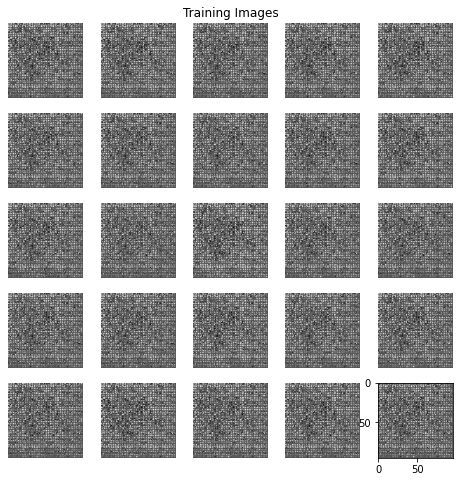

********************
 Epoch 0 and iteration 0 
<class 'numpy.ndarray'>
(96, 96, 1)


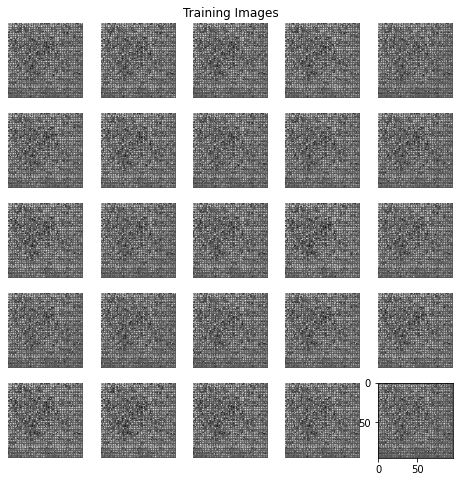

********************
 Epoch 0 and iteration 10 
<class 'numpy.ndarray'>
(96, 96, 1)


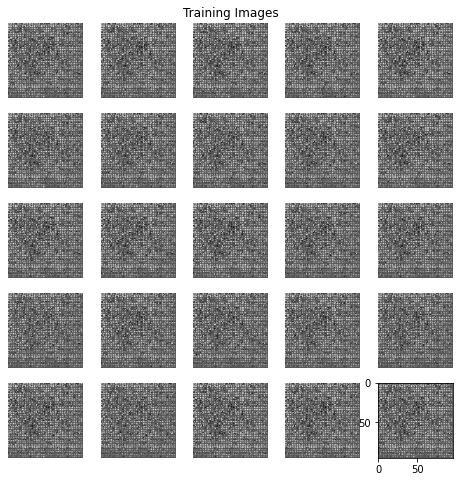

********************
 Epoch 0 and iteration 20 
<class 'numpy.ndarray'>
(96, 96, 1)


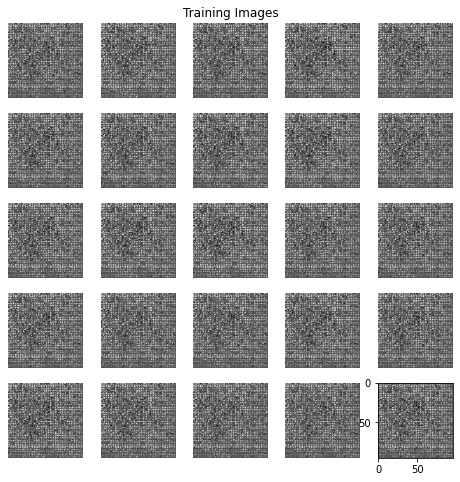

********************
 Epoch 0 and iteration 30 
<class 'numpy.ndarray'>
(96, 96, 1)


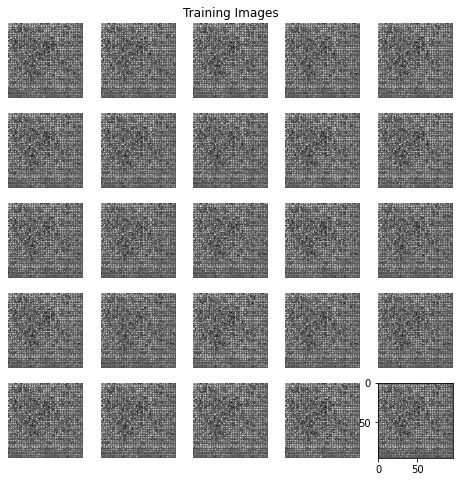

********************
 Epoch 1 and iteration 0 
<class 'numpy.ndarray'>
(96, 96, 1)


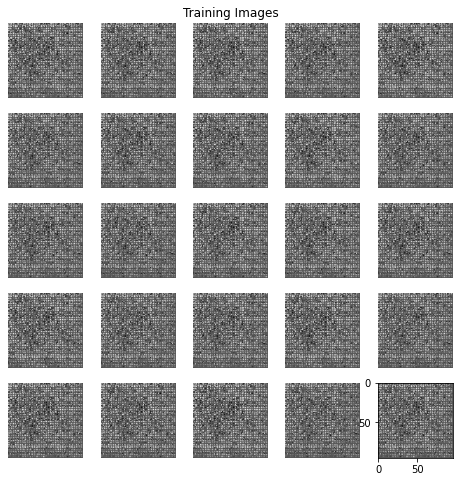

********************
 Epoch 1 and iteration 10 
<class 'numpy.ndarray'>
(96, 96, 1)


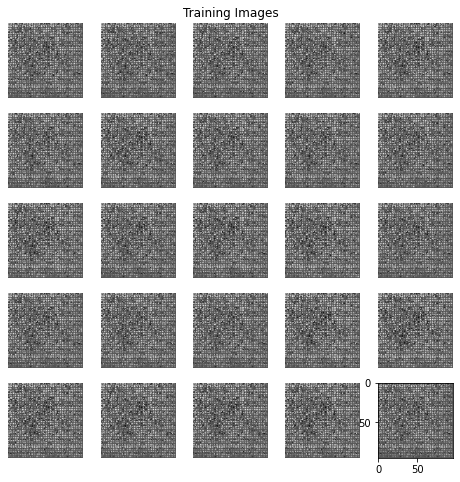

********************
 Epoch 1 and iteration 20 
<class 'numpy.ndarray'>
(96, 96, 1)


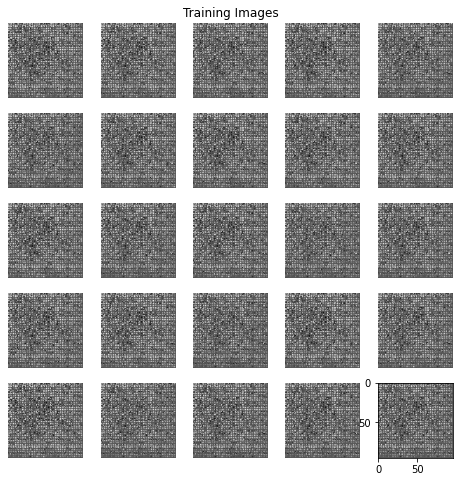

********************
 Epoch 1 and iteration 30 
<class 'numpy.ndarray'>
(96, 96, 1)


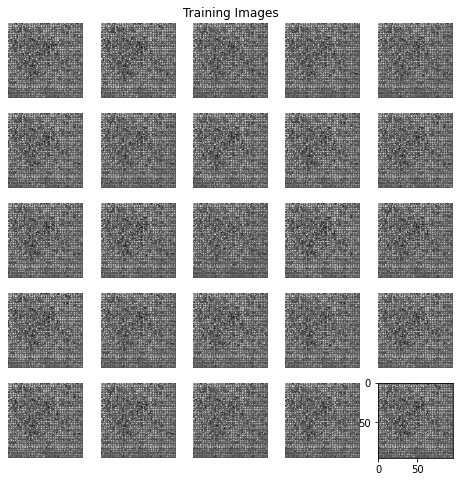

********************
 Epoch 2 and iteration 0 
<class 'numpy.ndarray'>
(96, 96, 1)


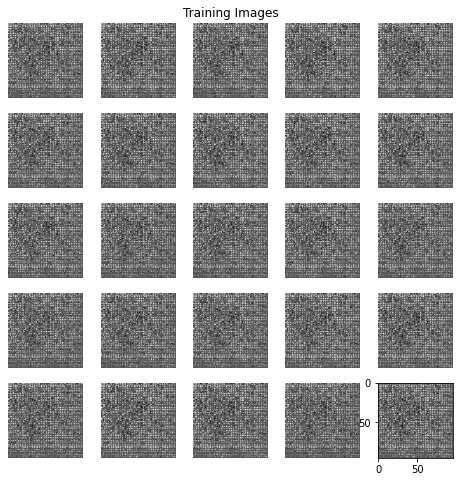

********************
 Epoch 2 and iteration 10 
<class 'numpy.ndarray'>
(96, 96, 1)


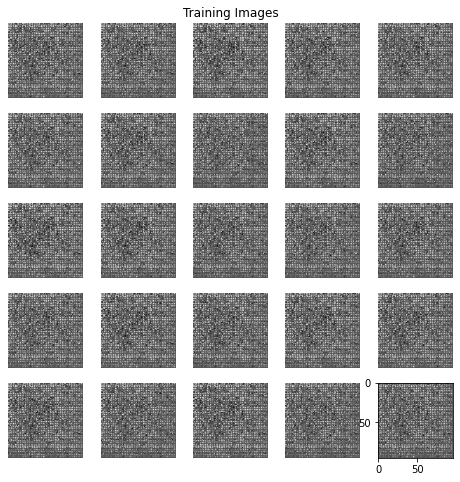

********************
 Epoch 2 and iteration 20 
<class 'numpy.ndarray'>
(96, 96, 1)


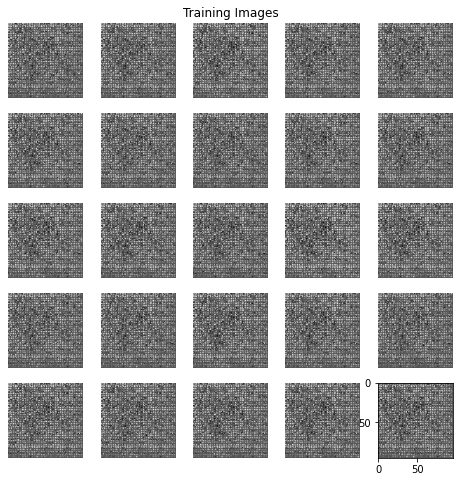

********************
 Epoch 2 and iteration 30 
<class 'numpy.ndarray'>
(96, 96, 1)


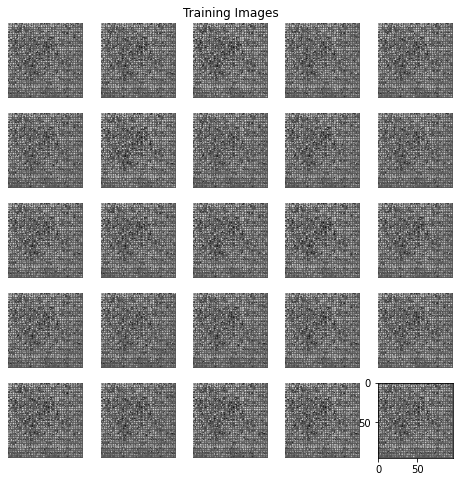

********************
 Epoch 3 and iteration 0 
<class 'numpy.ndarray'>
(96, 96, 1)


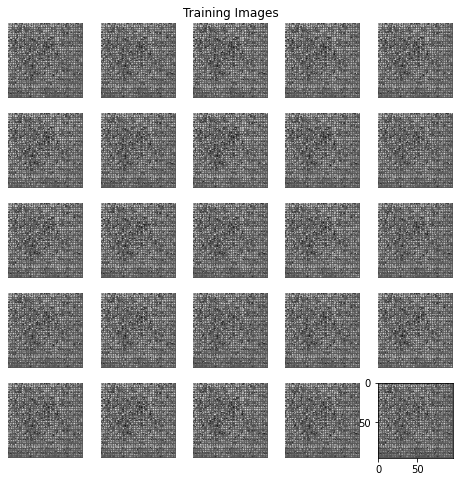

********************
 Epoch 3 and iteration 10 
<class 'numpy.ndarray'>
(96, 96, 1)


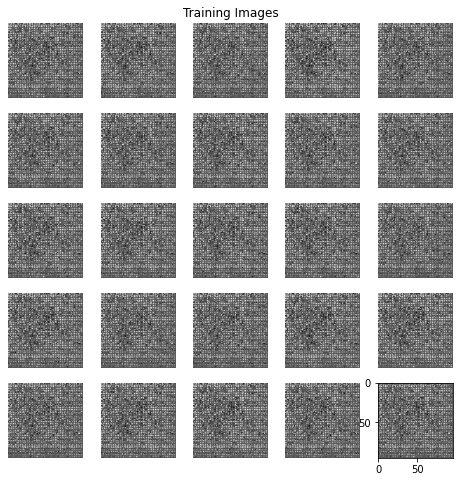

********************
 Epoch 3 and iteration 20 
<class 'numpy.ndarray'>
(96, 96, 1)


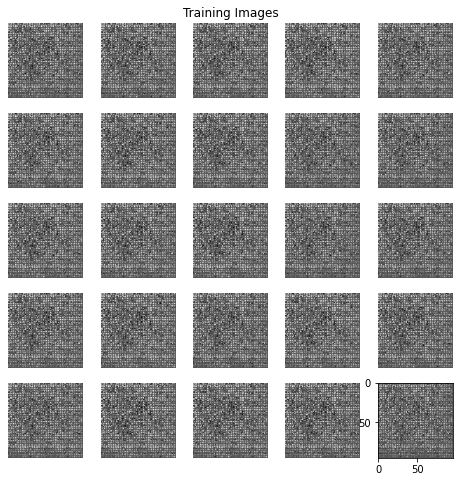

********************
 Epoch 3 and iteration 30 
<class 'numpy.ndarray'>
(96, 96, 1)


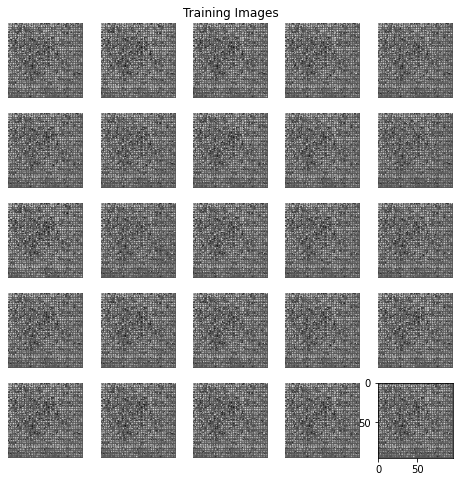

********************
 Epoch 4 and iteration 0 
<class 'numpy.ndarray'>
(96, 96, 1)


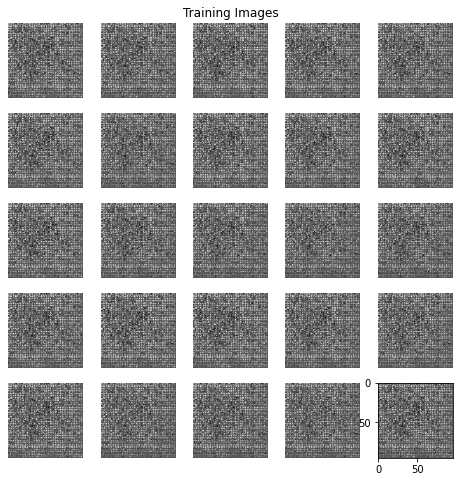

********************
 Epoch 4 and iteration 10 
<class 'numpy.ndarray'>
(96, 96, 1)


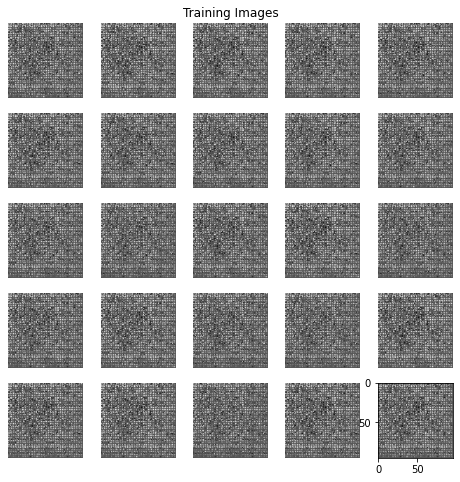

********************
 Epoch 4 and iteration 20 
<class 'numpy.ndarray'>
(96, 96, 1)


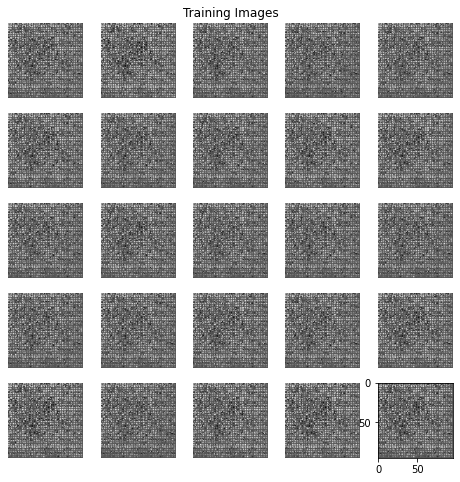

********************
 Epoch 4 and iteration 30 
<class 'numpy.ndarray'>
(96, 96, 1)


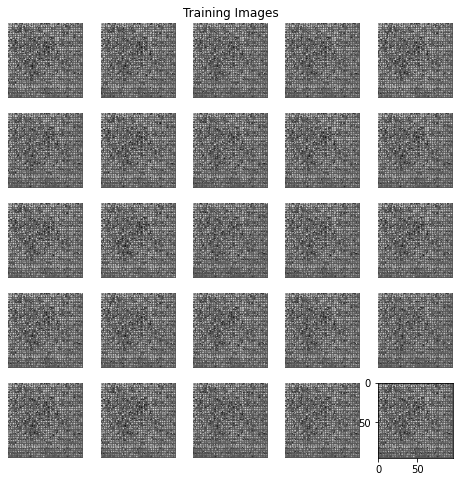

********************
 Epoch 5 and iteration 0 
<class 'numpy.ndarray'>
(96, 96, 1)


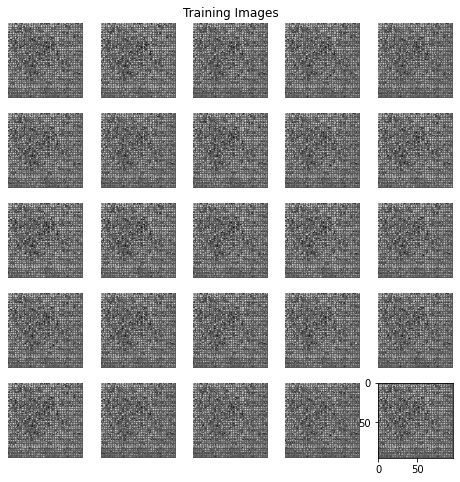

********************
 Epoch 5 and iteration 10 
<class 'numpy.ndarray'>
(96, 96, 1)


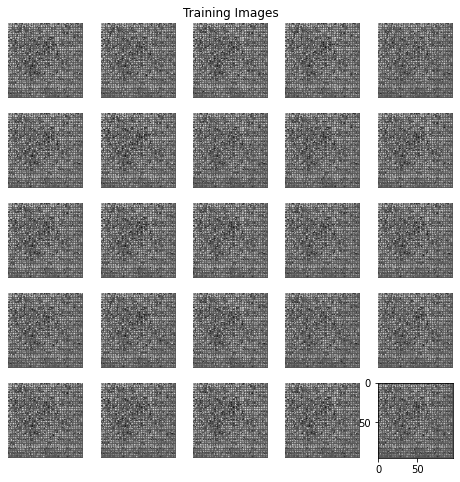

********************
 Epoch 5 and iteration 20 
<class 'numpy.ndarray'>
(96, 96, 1)


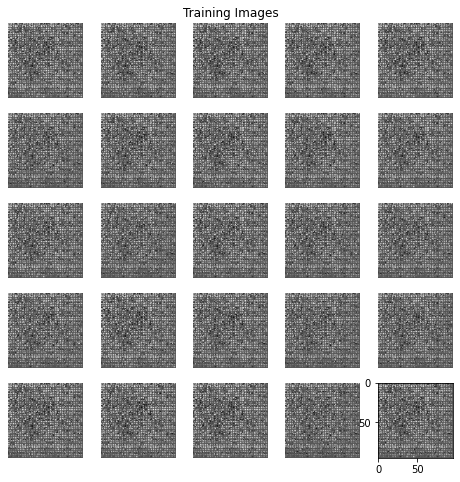

********************
 Epoch 5 and iteration 30 
<class 'numpy.ndarray'>
(96, 96, 1)


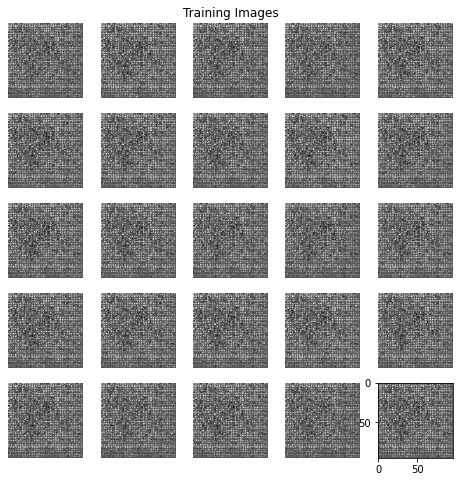

********************
 Epoch 6 and iteration 0 
<class 'numpy.ndarray'>
(96, 96, 1)


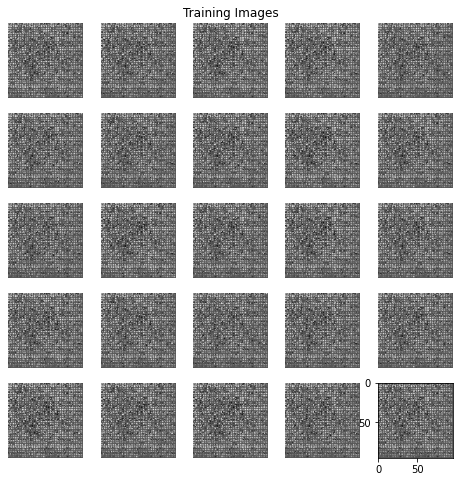

********************
 Epoch 6 and iteration 10 
<class 'numpy.ndarray'>
(96, 96, 1)


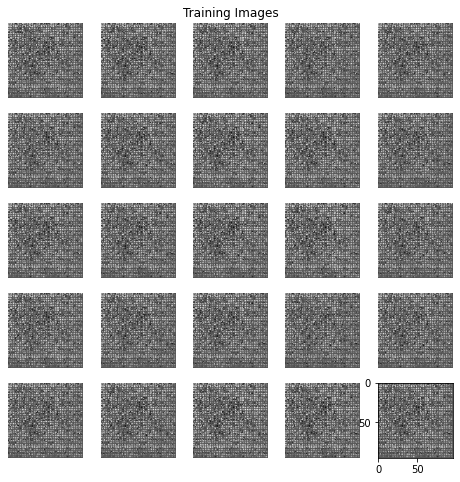

********************
 Epoch 6 and iteration 20 
<class 'numpy.ndarray'>
(96, 96, 1)


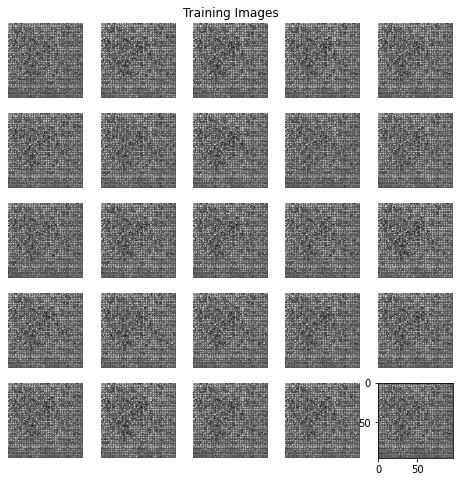

********************
 Epoch 6 and iteration 30 
<class 'numpy.ndarray'>
(96, 96, 1)


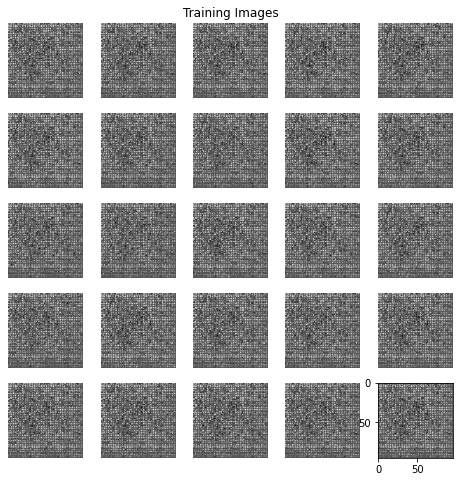

********************
 Epoch 7 and iteration 0 
<class 'numpy.ndarray'>
(96, 96, 1)


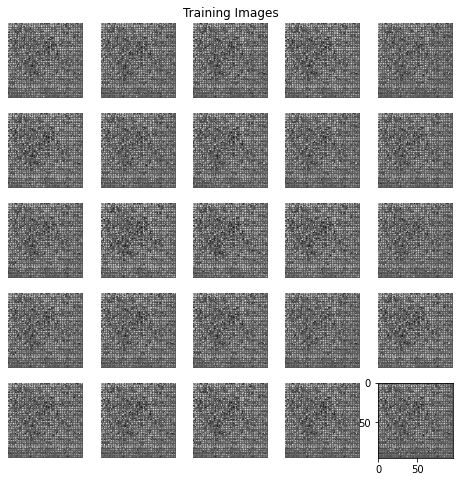

********************
 Epoch 7 and iteration 10 
<class 'numpy.ndarray'>
(96, 96, 1)


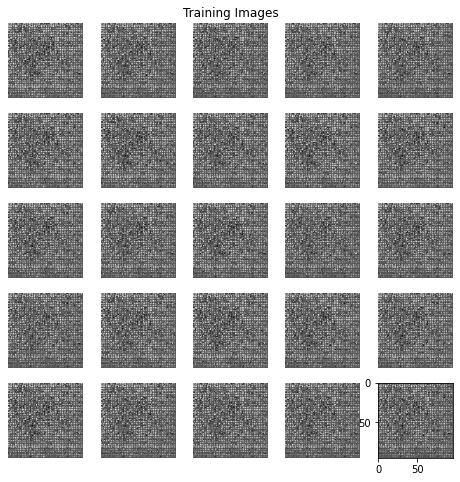

********************
 Epoch 7 and iteration 20 
<class 'numpy.ndarray'>
(96, 96, 1)


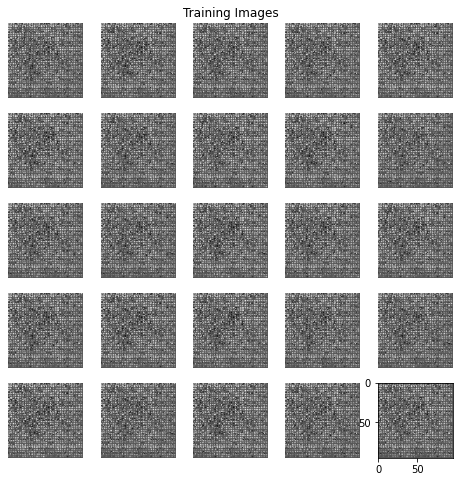

********************
 Epoch 7 and iteration 30 
<class 'numpy.ndarray'>
(96, 96, 1)


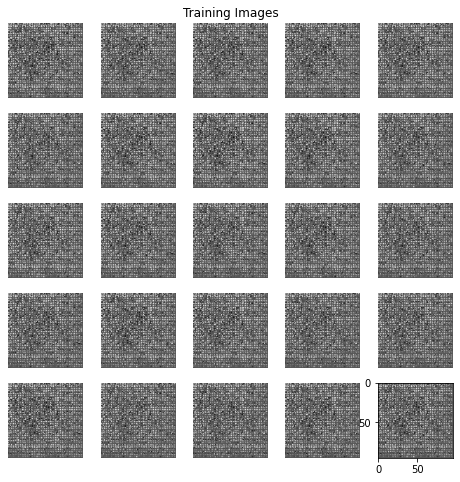

********************
 Epoch 8 and iteration 0 
<class 'numpy.ndarray'>
(96, 96, 1)


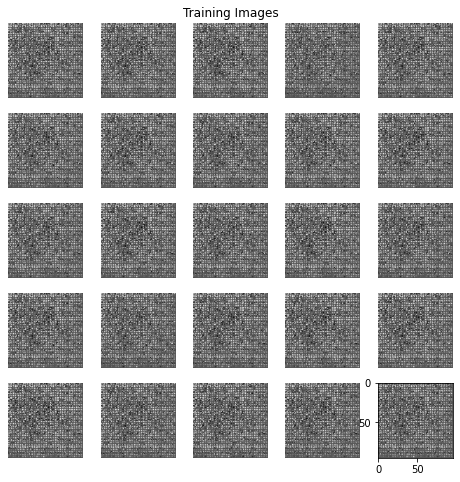

********************
 Epoch 8 and iteration 10 
<class 'numpy.ndarray'>
(96, 96, 1)


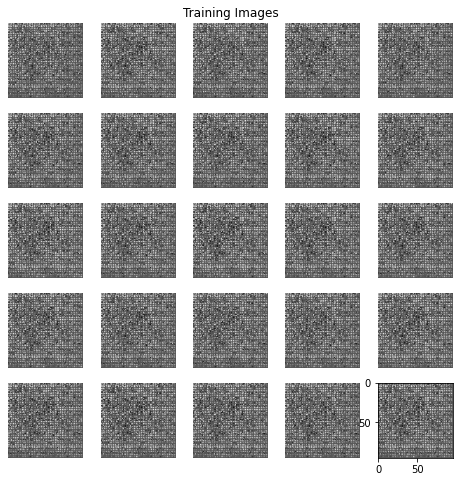

********************
 Epoch 8 and iteration 20 
<class 'numpy.ndarray'>
(96, 96, 1)


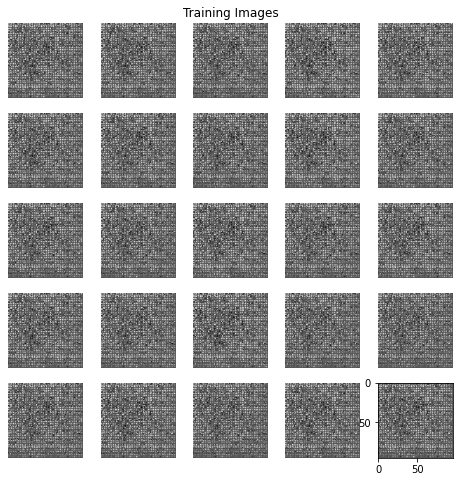

********************
 Epoch 8 and iteration 30 
<class 'numpy.ndarray'>
(96, 96, 1)


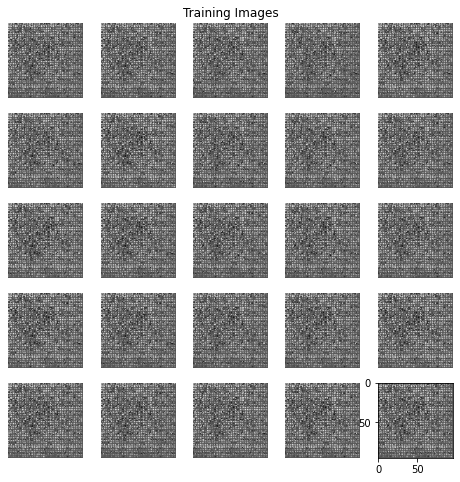

********************
 Epoch 9 and iteration 0 
<class 'numpy.ndarray'>
(96, 96, 1)


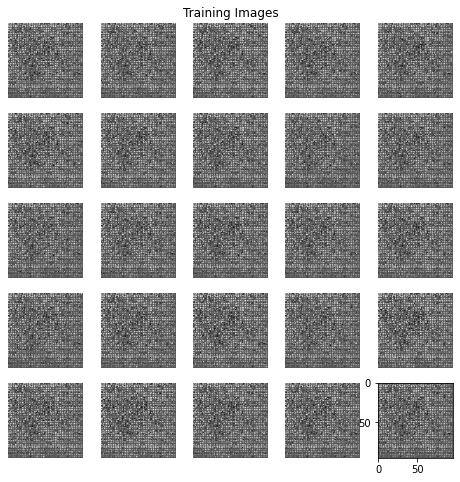

********************
 Epoch 9 and iteration 10 
<class 'numpy.ndarray'>
(96, 96, 1)


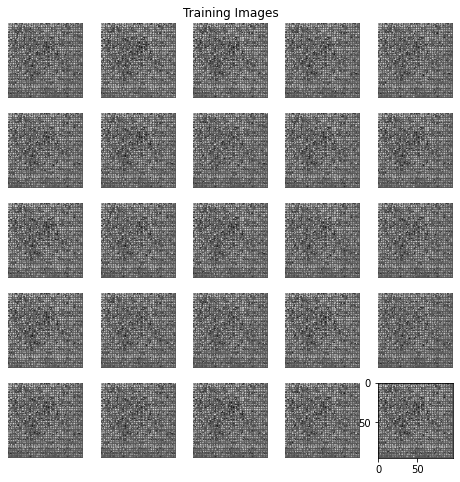

********************
 Epoch 9 and iteration 20 
<class 'numpy.ndarray'>
(96, 96, 1)


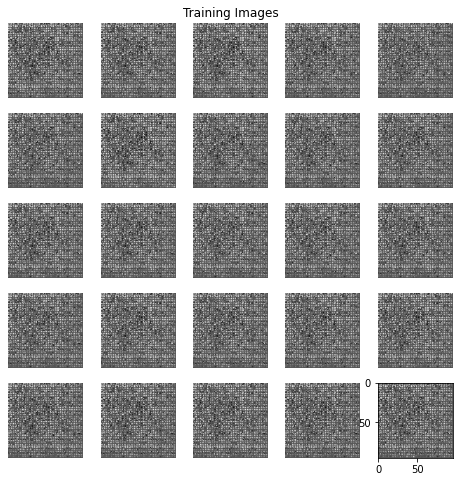

********************
 Epoch 9 and iteration 30 


FileNotFoundError: ignored

In [ ]:
epochs = 50
 
# going over the entire dataset 10 times
for e in range(epochs):
     
    # pick each batch b of input images: shape of each batch is (32, 3, 32, 32)
    for i, b in enumerate(dataloader):
        # print(b.shape)
        
        ##########################
        ## Update Discriminator ##
        ##########################
 
        # Loss on real images
         
        # clear the gradient
        opt_D.zero_grad() # set the gradients to 0 at start of each loop because gradients are accumulated on subsequent backward passes
        # compute the D model output
        # aux = netD(b.to(device)).view(-1)
        # print(aux.shape)
        yhat = netD(b.to(device)).view(-1) # view(-1) reshapes a 4-d tensor of shape (2,1,1,1) to 1-d tensor with 2 values only
        # specify target labels or true labels
        target = torch.ones(len(b), dtype=torch.float, device=device)
        # calculate loss
        # print(yhat.shape)
        # print(yhat.shape)
        # print("target:", target.shape)
        loss_real = loss(yhat, target)
        # calculate gradients -  or rather accumulation of gradients on loss tensor
        loss_real.backward()
 
        # Loss on fake images
 
        # generate batch of fake images using G
        # Step1: creating noise to be fed as input to G
        noise = torch.randn(len(b), 100, 1, 1, device = device)
        # print(noise.shape)
        # Step 2: feed noise to G to create a fake img (this will be reused when updating G)
        fake_img = netG(noise)

        if e >=10:
          batches_done = e * len(dataloader) + i
          # print(fake_img.data[0].shape)
          save_image(fake_img.data[0], "/content/gdrive/MyDrive/Colab Notebooks/Images/%d.png" % batches_done)
        # compute D model output on fake images
        # print(fake_img.shape)
        yhat = netD.cuda()(fake_img.detach()).view(-1) # .cuda() is essential because our input i.e. fake_img is on gpu but model isnt (runtimeError thrown); detach is imp: Basically, only track steps on your generator optimizer when training the generator, NOT the discriminator. 
        # specify target labels
        
        target = torch.zeros(len(b), dtype=torch.float, device=device)
        # calculate loss
        loss_fake = loss(yhat, target)
        # calculate gradients
        loss_fake.backward()
 
        # total error on D
        loss_disc = loss_real + loss_fake
 
        # Update weights of D
        opt_D.step()
 
        ##########################
        #### Update Generator ####
        ##########################
 
        # clear gradient
        opt_G.zero_grad()
        # pass fake image through D
        yhat = netD.cuda()(fake_img).view(-1)
        # specify target variables - remember G wants D *to think* these are real images so label is 1
        target = torch.ones(len(b), dtype=torch.float, device=device)
        # calculate loss
        
        loss_gen = loss(yhat, target)
        # calculate gradients
        loss_gen.backward()
        # update weights on G
        opt_G.step()
 
 
        ####################################
        #### Plot some Generator images ####
        ####################################
 
        # during every epoch, print images at every 10th iteration.
        if i% 10 == 0:
            # convert the fake images from (b_size, 3, 32, 32) to (b_size, 32, 32, 3) for plotting 
            img_plot = np.transpose(fake_img.detach().cpu(), (0,2,3,1)) # .detach().cpu() is imp for copying fake_img tensor to host memory first
            img_plot = img_plot.numpy()
            print(type(img_plot))
            print(img_plot[0].shape)
            #cv.imwrite(img_plot[0], 'pic.png')
            
            plot_images((img_plot[:,:,:,0] * 255).astype(np.uint8)) #sa nu mai apara warningul cu clipping input data etc etc
            # plot_images(img_plot)
            
            print("********************")
            print(" Epoch %d and iteration %d " % (e, i))